In [ ]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

# Dog Breed Classification

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

From Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* Dealing with images (unstructured data)
* There are 120 breeds of dogs
* There are around 10,000+ images in the training set (These images have labels)
* There are around 10,000+ images in the test set (these images don't have labels because we want to predict them)

### Getting our workspace ready

In [ ]:
# Importing necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Checking for GPU availability
print("GPU", "available (YESS)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU available (YESS)


# Getting our data ready (turning into tensors)

our data should be in numerical format. Turnning our images into tensors.

In [ ]:
# Checking out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

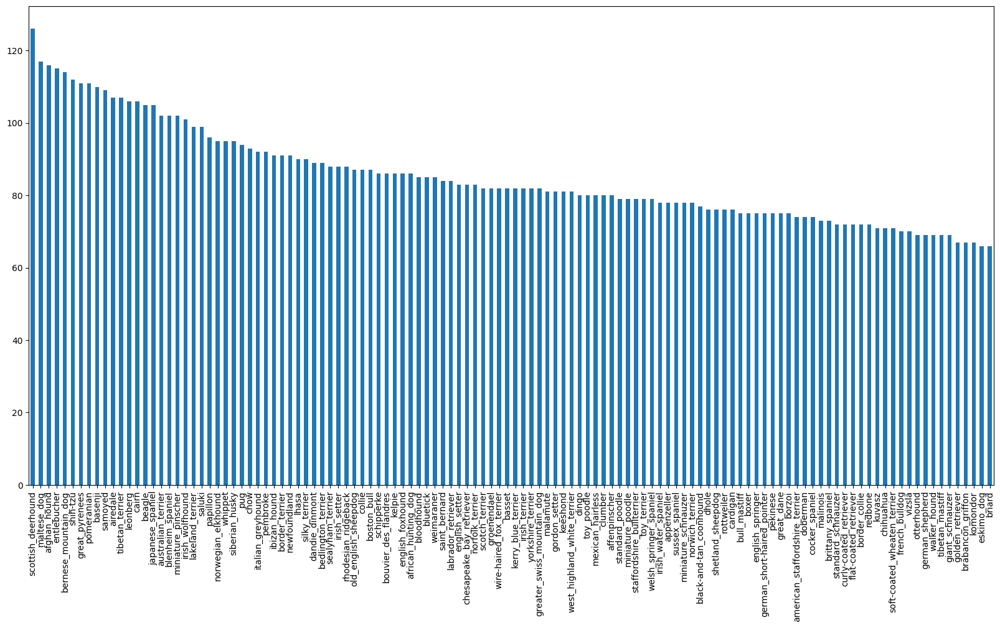

In [ ]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

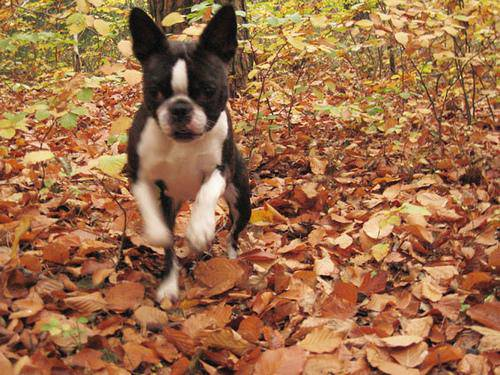

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels

Let's get a list of all of our image file pathnames


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Creating pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Checking the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!! Proceed")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!! Proceed


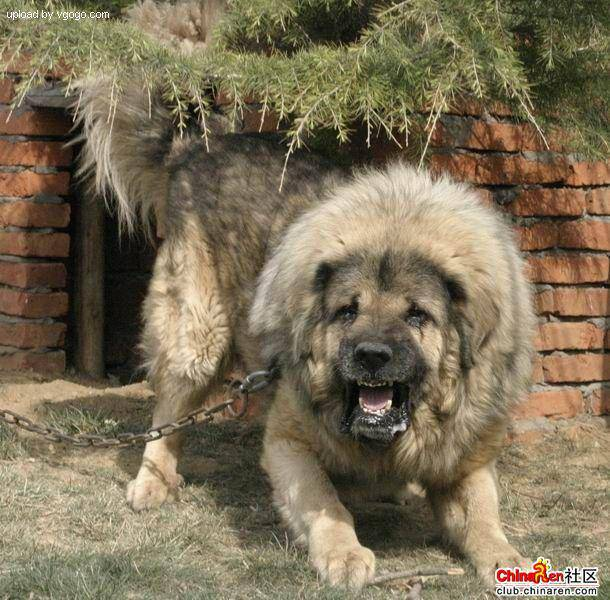

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Seeing if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames, check data directories")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turning a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Eg: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [ ]:
# Setting up X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
# Going to start off experimenting with 1000 images and increase as needed
# Setting number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split out data inton train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size  NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

## Preprocessing images (turning image into Tensors)

In [ ]:
# Converting image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Turning image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Defining image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  # Read in image file
  image = tf.io.read_file(image_path)

  # Turning the jpeg image into numerical tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Converting the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resizing the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [ ]:
# Creating a simple function
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors
in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into bathes.

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checking out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Creating a function for viewing images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))

  # Loop through 25 images
  for i in range(25):
    # Creating subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Displaying an image
    plt.imshow(images[i])
    # Adding image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turning the grid lines off
    plt.axis("off")

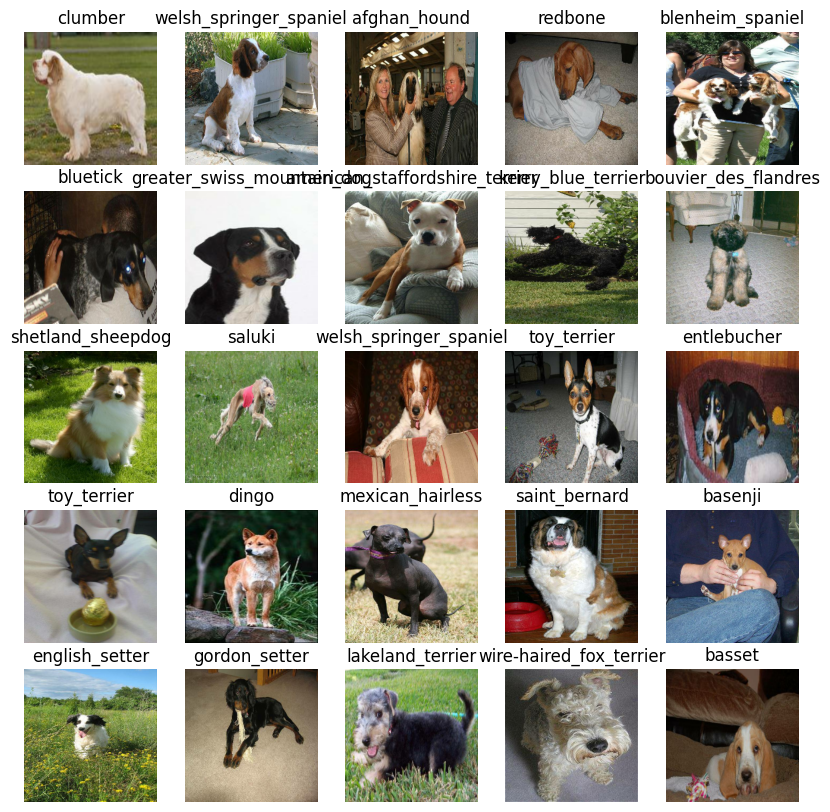

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

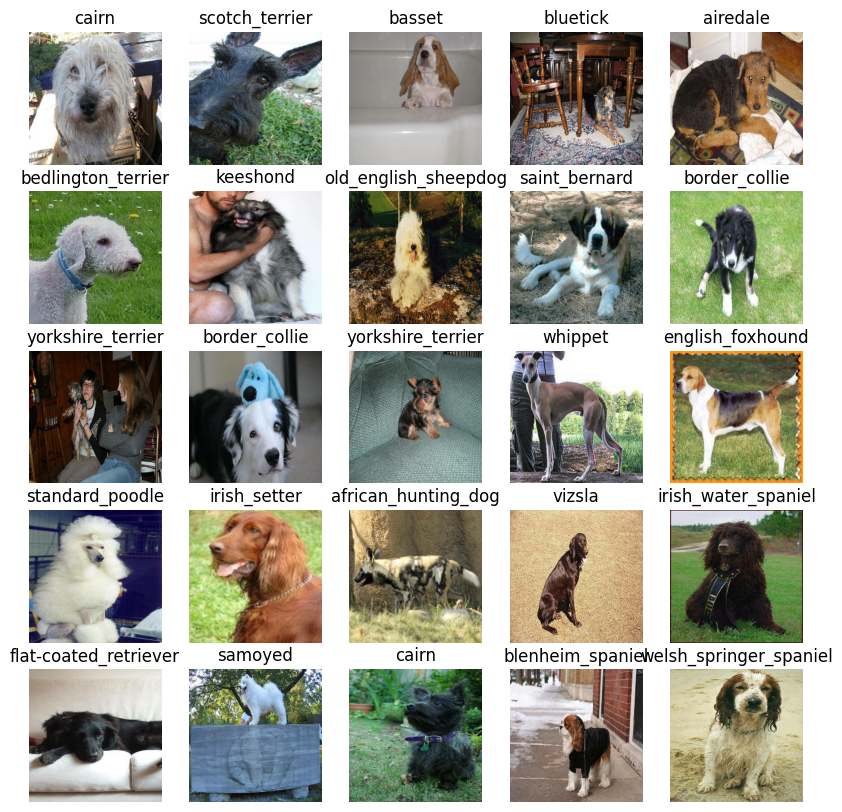

In [ ]:
# Now visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model url from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Creating a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compiling the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Building the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating callbacks

# TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating a function to build a tensorboard callback
def create_tensorboard_callback():
  # Creating a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs set tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [ ]:
# Creating a early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a Model

In [ ]:
# Our first model is only going to train on 1000 images, to make sure everything is working.

NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Checking to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Let's create a function which trains a model

In [ ]:
# Building a function to train and return a trained model
def train_model():
  # Creating a model
  model = create_model()

  # Creating new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fitting the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fiited model'
  return model

In [ ]:
# Fitting the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 135s 4s/step - loss: 4.5041 - accuracy: 0.1050 - val_loss: 3.4284 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 5s 185ms/step - loss: 1.5829 - accuracy: 0.7025 - val_loss: 2.1986 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 3s 121ms/step - loss: 0.5352 - accuracy: 0.9463 - val_loss: 1.7338 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2422 - accuracy: 0.9912 - val_loss: 1.5170 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 182ms/step - loss: 0.1451 - accuracy: 0.9987 - val_loss: 1.4424 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 3s 124ms/step - loss: 0.0983 - accuracy: 1.0000 - val_loss: 1.4144 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================

## Checking the TensorBoard logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using trained model

In [ ]:
# Making prediction on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 96ms/step


array([[2.3325859e-03, 3.1313011e-05, 8.2332612e-04, ..., 6.4521708e-05,
        8.3237755e-06, 1.5733816e-03],
       [4.0350184e-03, 9.5207233e-04, 7.8336848e-03, ..., 1.3530237e-04,
        2.2792139e-03, 1.9841889e-04],
       [3.9915758e-05, 7.2896270e-05, 1.3532152e-04, ..., 2.1508165e-05,
        2.5256026e-05, 2.9547850e-04],
       ...,
       [3.8184351e-07, 2.4241133e-06, 3.0577717e-06, ..., 7.8297359e-07,
        3.0035104e-05, 6.9924777e-06],
       [8.4392494e-04, 1.6017430e-04, 3.9226059e-05, ..., 1.3066764e-04,
        2.9116241e-05, 2.4444871e-03],
       [2.5516614e-05, 7.9416539e-05, 1.0796083e-02, ..., 1.4220774e-02,
        1.3726731e-03, 2.3953343e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
# First predictions
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.33258586e-03 3.13130113e-05 8.23326118e-04 2.90702919e-05
 2.32891252e-04 4.06488471e-05 1.52204670e-02 4.81336538e-05
 8.70308722e-05 1.05352770e-03 3.65835294e-05 1.50616412e-04
 1.74659712e-04 1.26596933e-04 2.32626888e-04 5.07317483e-04
 2.56500149e-04 6.39158115e-02 1.46664588e-05 5.15441980e-06
 3.90213099e-04 5.09922211e-05 1.06532589e-05 8.88345414e-04
 2.78438461e-06 4.00310491e-05 3.96375686e-01 4.04804086e-05
 3.85441410e-04 1.03968494e-04 5.98069491e-05 2.68287113e-04
 2.03999720e-04 4.51950291e-06 4.55026066e-06 4.80993986e-02
 5.83115252e-05 1.93373460e-04 3.33958815e-05 1.64808560e-04
 3.70780384e-04 9.20409457e-06 7.38177114e-05 9.56336735e-05
 2.67284231e-05 3.43344291e-04 9.17446960e-05 4.70861909e-04
 1.19086719e-04 4.24600221e-05 2.76622071e-04 5.95203928e-05
 1.40329954e-04 3.35240293e-05 1.93789747e-05 8.10501206e-06
 4.15811883e-05 1.37976138e-03 7.05929560e-05 2.53725439e-01
 7.11168512e-04 1.27440208e-05 5.36622154e-03 3.08788776e-06
 2.25155032e-04 1.915761

In [ ]:
# Turning probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Getting a predictedd label base on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Creating a function to unbatch a batch dataset

def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# Looping through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                 np.max(pred_prob)*100,
                                 true_label),
                                 color=color)

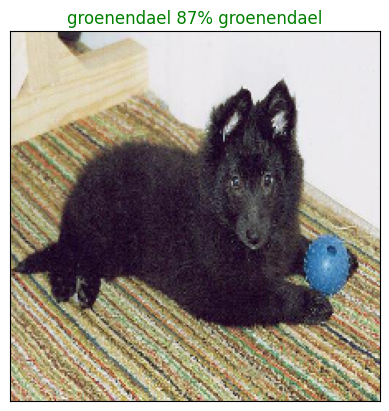

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], label[n]

  # Get the predicted label
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


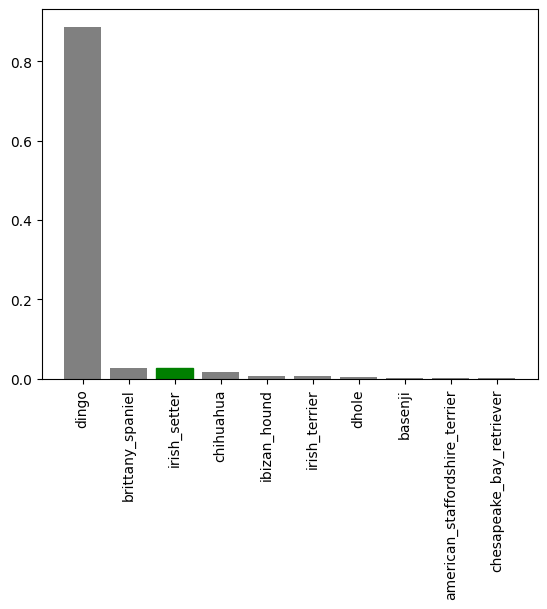

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=81)

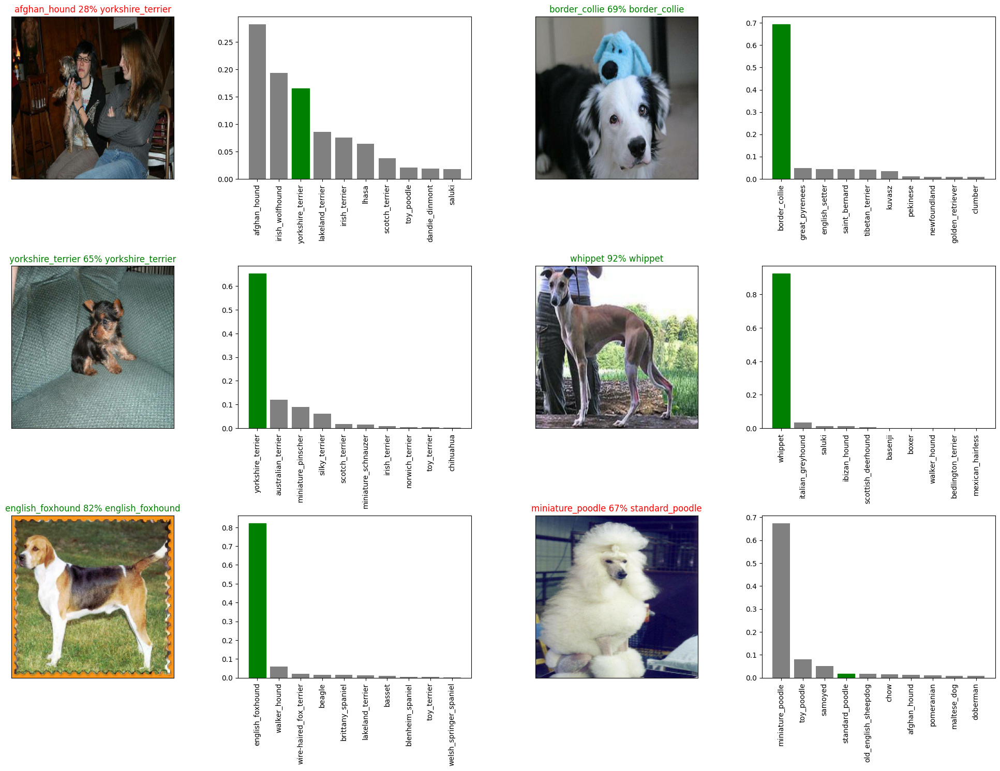

In [ ]:
# Let's checkout a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a model

In [ ]:
# Creating a function to save a model
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Saving format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Creating a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Saving a model trainred on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230906-16361694018164-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230906-16361694018164-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20230906-11281693999723-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230906-11281693999723-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluating the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 144ms/step - loss: 1.2559 - accuracy: 0.7000


[1.255924940109253, 0.699999988079071]

# training a big dog model (full dataset)

In [ ]:
# Creating a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Creating a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Creating full model callbacks
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fitting the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 43s 122ms/step - loss: 1.3376 - accuracy: 0.6672
Epoch 2/100
320/320 [==============================] - 36s 113ms/step - loss: 0.4037 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 35s 108ms/step - loss: 0.2391 - accuracy: 0.9339
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1546 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1066 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0766 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0590 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0460 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 34s 108ms/step - loss: 0.0380 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 36s 111m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230906-16451694018705-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230906-16451694018705-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Loading in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230906-16451694018705-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230906-16451694018705-full-image-set-mobilenetv2-Adam.h5


# Making prediction on the test dataset

In [ ]:
# Loading the test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog Vision/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg',
 'drive/MyDrive/Dog Vision/test/e6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 'drive/MyDrive/Dog Vision/test/e1f7ec4bd372612f53411026aaabf233.jpg',
 'drive/MyDrive/Dog Vision/test/e176e183224bc71ce64edb44cb94688e.jpg',
 'drive/MyDrive/Dog Vision/test/e4369279919beecfb6d91a5375bc122f.jpg',
 'drive/MyDrive/Dog Vision/test/e3a55cc9c91da472abbced51d98d6ff6.jpg',
 'drive/MyDrive/Dog Vision/test/dccc6c6c2f8cb55631b6ce664bf21fee.jpg',
 'drive/MyDrive/Dog Vision/test/e6343c835d2d07d7f3ac962b92415743.jpg']

In [ ]:
# Creating test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 199s 599ms/step


In [ ]:
# Save predictions to csv file
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.57885399e-10, 2.20000758e-04, 1.47950185e-08, ...,
        9.09989524e-07, 3.54298595e-06, 9.96405319e-11],
       [6.77505255e-01, 7.27107885e-09, 2.36210145e-08, ...,
        1.00921349e-09, 2.55192134e-07, 1.10865432e-04],
       [6.49742219e-07, 7.85992071e-08, 3.98710576e-08, ...,
        3.29977468e-09, 7.71919622e-06, 1.18990332e-01],
       ...,
       [2.41005353e-07, 1.10687672e-07, 2.04612718e-07, ...,
        1.23892190e-11, 6.05671568e-10, 5.06170750e-09],
       [7.66440245e-09, 3.34342319e-12, 1.80196689e-12, ...,
        5.48653033e-11, 4.20991922e-11, 2.40233056e-10],
       [1.84746128e-07, 2.83988385e-07, 2.23527067e-07, ...,
        7.85376324e-06, 8.77231359e-01, 1.82101564e-06]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle


In [ ]:
# Creating a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Appending test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(de5496c6b58f66ab890ab24087d9e220, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(e7f95aabf775a636b3893ffa120adaf9, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(e2686707ac5b5f75ce2ccbc906b624d8, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(e6e8ae7dc0e71c6ae868fd3371fde010, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e1f7ec4bd372612f53411026aaabf233, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Adding the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(de5496c6b58f66ab890ab24087d9e220, .jpg)",1.578854e-10,2.200008e-04,1.479502e-08,6.804317e-05,5.586101e-10,3.662116e-08,3.923153e-10,6.198719e-10,3.588607e-08,...,8.007701e-11,1.115544e-11,2.509042e-10,1.834265e-06,1.969289e-08,4.827374e-10,7.148620e-09,9.099895e-07,3.542986e-06,9.964053e-11
1,"(e7f95aabf775a636b3893ffa120adaf9, .jpg)",6.775053e-01,7.271079e-09,2.362101e-08,1.243894e-10,8.299260e-08,1.616488e-09,7.454248e-07,2.619129e-09,5.101743e-09,...,1.002747e-04,1.416024e-07,9.289344e-08,6.586147e-09,6.162901e-08,4.516903e-09,3.033257e-09,1.009213e-09,2.551921e-07,1.108654e-04
2,"(e2686707ac5b5f75ce2ccbc906b624d8, .jpg)",6.497422e-07,7.859921e-08,3.987106e-08,1.584589e-07,2.532920e-07,6.851505e-12,2.207537e-07,9.990810e-06,3.010216e-08,...,3.663923e-03,1.376619e-05,3.403139e-08,1.693727e-06,4.714752e-07,1.751340e-06,2.701805e-02,3.299775e-09,7.719196e-06,1.189903e-01
3,"(e6e8ae7dc0e71c6ae868fd3371fde010, .jpg)",5.330507e-07,6.025213e-08,8.523459e-10,6.054304e-11,1.880430e-10,1.107875e-10,5.092070e-12,8.178987e-10,1.222287e-11,...,1.409116e-09,2.048228e-09,1.138135e-10,2.077269e-11,5.820368e-11,1.051646e-12,1.393737e-12,7.634917e-10,1.577062e-08,3.086583e-08
4,"(e1f7ec4bd372612f53411026aaabf233, .jpg)",1.000872e-09,2.548998e-10,7.319497e-12,9.794894e-14,2.734679e-08,5.532401e-10,2.620053e-11,7.572940e-09,2.266047e-12,...,1.266465e-10,7.550390e-11,4.184507e-12,1.732600e-09,1.194674e-09,1.741910e-10,1.997898e-07,7.878954e-13,2.423943e-11,1.446416e-12


In [ ]:
# Saving our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making prediction on custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog 1.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog 3.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog 2.jpg']

In [ ]:
# Turning custom images into batche datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 652ms/step


In [ ]:
custom_preds

array([[6.77302808e-07, 1.09221410e-05, 5.41606815e-10, 4.49229312e-08,
        6.58238832e-06, 2.11561035e-09, 1.06185951e-04, 1.02336941e-07,
        1.51282848e-07, 1.01944671e-07, 6.34230958e-07, 1.13037210e-07,
        1.03398989e-07, 2.89083943e-07, 9.22879266e-08, 1.49201995e-07,
        1.07058179e-06, 1.05667608e-08, 9.48795389e-08, 5.21926009e-11,
        3.66858046e-08, 1.35912424e-05, 2.86874080e-08, 1.09414441e-06,
        2.86691920e-06, 1.78676692e-05, 5.66748759e-10, 3.22585663e-07,
        2.25811633e-07, 4.10838794e-08, 2.67454219e-04, 6.35498844e-04,
        3.81515529e-05, 6.80905288e-08, 1.37237691e-07, 2.78322515e-03,
        1.51406621e-08, 6.44233040e-08, 1.80184556e-09, 9.46146156e-06,
        2.98226473e-06, 2.92265440e-07, 5.13279474e-07, 5.04898132e-08,
        7.88425859e-06, 1.93825508e-06, 2.27491217e-08, 8.55464033e-10,
        8.15562018e-08, 9.00275409e-01, 2.47241746e-06, 8.50405470e-08,
        1.82911884e-02, 1.44205478e-04, 1.66758962e-08, 1.664586

In [ ]:
# Getting custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'pembroke']

In [ ]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

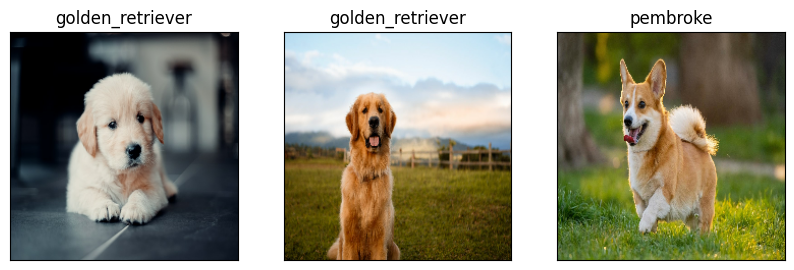

In [ ]:
# Checking custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
def predict_input_image(image):
  img_4d=image.reshape(1, 224, 224, 3)
  prediction=model.predict(img_4d)[0]
  return {preds_df[i]: float(prediction[i]) for i in range(5)}


import gradio as gr

image = gr.inputs.Image(shape=(224, 224))

label = gr.outputs.Label(num_top_classes=5)

gr.Interface(fn=predict_input_image, inputs=image, outputs=label,interpretation='default').launch(debug='True')

<ipython-input-177-df91c8912778>:9: GradioDeprecationWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  image = gr.inputs.Image(shape=(224, 224))
<ipython-input-177-df91c8912778>:9: GradioDeprecationWarning: `optional` parameter is deprecated, and it has no effect
  image = gr.inputs.Image(shape=(224, 224))
<ipython-input-177-df91c8912778>:11: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  label = gr.outputs.Label(num_top_classes=5)
<ipython-input-177-df91c8912778>:11: GradioUnusedKwargWarning: You have unused kwarg parameters in Label, please remove them: {'type': 'auto'}
  label = gr.outputs.Label(num_top_classes=5)


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

1/1 [==============================] - 1s 1s/step


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pandas/core/indexes/base.py", line 3802, in get_loc
    return self._engine.get_loc(casted_key)
  File "pandas/_libs/index.pyx", line 138, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/index.pyx", line 165, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 5745, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 5753, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 0

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/gradio/routes.py", line 523, in run_predict
    output = await app.get_blocks().process_api(
  File "/usr/local/lib/python3.10/dist-packages/gradio/blocks.py", line 1437, in process_api
    result = await self.call_function(
  File "/usr/local/lib/python3.1

In [ ]:
len(unique_breeds)

120

In [ ]:
model.summary()
unique_breeds = ['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
       'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael',
       'ibizan_hound', 'irish_setter', 'irish_terrier',
       'irish_water_spaniel', 'irish_wolfhound', 'italian_greyhound',
       'japanese_spaniel', 'keeshond', 'kelpie', 'kerry_blue_terrier',
       'komondor', 'kuvasz', 'labrador_retriever', 'lakeland_terrier',
       'leonberg', 'lhasa', 'malamute', 'malinois', 'maltese_dog',
       'mexican_hairless', 'miniature_pinscher', 'miniature_poodle',
       'miniature_schnauzer', 'newfoundland', 'norfolk_terrier',
       'norwegian_elkhound', 'norwich_terrier', 'old_english_sheepdog',
       'otterhound', 'papillon', 'pekinese', 'pembroke', 'pomeranian',
       'pug', 'redbone', 'rhodesian_ridgeback', 'rottweiler',
       'saint_bernard', 'saluki', 'samoyed', 'schipperke',
       'scotch_terrier', 'scottish_deerhound', 'sealyham_terrier',
       'shetland_sheepdog', 'shih-tzu', 'siberian_husky', 'silky_terrier',
       'soft-coated_wheaten_terrier', 'staffordshire_bullterrier',
       'standard_poodle', 'standard_schnauzer', 'sussex_spaniel',
       'tibetan_mastiff', 'tibetan_terrier', 'toy_poodle', 'toy_terrier',
       'vizsla', 'walker_hound', 'weimaraner', 'welsh_springer_spaniel',
       'west_highland_white_terrier', 'whippet',
       'wire-haired_fox_terrier', 'yorkshire_terrier']

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  multiple                  5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
loaded_full_model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_13[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                          